<a href="https://colab.research.google.com/github/Itallo0708/Computational-Mathematics/blob/main/atividade_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Questão A)
Inicialmente importando bibliotecas e definindo funções essenciais para a execução do algoritmo do gradiente descendente.



In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

def calculate_ssr(intercept, slope, x, y):
    predictions = intercept + (slope * x)
    residuals = y - predictions
    ssr = np.sum(residuals ** 2)
    return ssr

def gradient_descent(learning_rate, start_intercept, x, y, slope, max_iterations=40, tolerance=0.001):
    # Executa o algoritmo de Gradiente Descendente.

    current_intercept = start_intercept
    history = []

    print(f"\n INICIANDO COM LEARNING RATE = {learning_rate}")

    # Adiciona o estado inicial.
    current_ssr = calculate_ssr(current_intercept, slope, x, y)

    # Calcula gradiente inicial.
    predictions = current_intercept + (slope * x)
    residuals = y - predictions
    gradient = -2 * np.sum(residuals)

    history.append((current_intercept, current_ssr, gradient))

    for i in range(max_iterations):
        # Calcular Gradiente.
        predictions = current_intercept + (slope * x)
        residuals = y - predictions
        gradient = -2 * np.sum(residuals)

        # Calcular Passo.
        step_size = gradient * learning_rate

        # Intercept.
        old_intercept = current_intercept
        new_intercept = old_intercept - step_size
        current_intercept = new_intercept

        # Novo Erro.
        current_ssr = calculate_ssr(current_intercept, slope, x, y)

        # Salvar Histórico.
        history.append((current_intercept, current_ssr, gradient))

        print(f"Iteração {i+1}: Old={old_intercept:.4f} | Grad={gradient:.4f} | Step={step_size:.4f} | New={new_intercept:.4f}")

        if abs(step_size) < tolerance:
            print(f"--> Convergiu na iteração {i+1}!")
            break

    return history

def setup_regression_view(ax, x_data, y_data, learning_rate):
    # gráfico da Reta
    ax.set_xlim(0, 3.5)
    ax.set_ylim(0, 4)

    # Plotar dados
    ax.scatter(x_data, y_data, color='green', s=100, label='Dados Reais', zorder=5)

    # Criar objeto da reta (vazio inicialmente)
    line, = ax.plot([], [], 'b-', linewidth=3, label='Reta Prevista')

    ax.set_title(f'Ajuste da Reta (LR={learning_rate})')
    ax.set_xlabel('Peso (x)')
    ax.set_ylabel('Altura (y)')
    ax.legend(loc='upper left')
    ax.grid(True, alpha=0.3)

    return line

def setup_cost_view(ax, cost_function, x_data, y_data, fixed_slope):
    # gráfico Curva de Custo
    # Gerar dados para a curva
    curve_x = np.linspace(-0.5, 2.5, 100)
    curve_y = [cost_function(b, fixed_slope, x_data, y_data) for b in curve_x]

    # Plotar a curva
    ax.plot(curve_x, curve_y, 'teal', alpha=0.5, linewidth=2, label='Curva de Custo (SSR)')

    # Configurar limites
    ax.set_xlim(-0.5, 2.5)
    ax.set_ylim(0, max(curve_y) + 1)

    # Criar elementos móveis (inicialmente vazios)
    dot, = ax.plot([], [], 'ro', markersize=10, zorder=5, label='Valor Atual')
    track, = ax.plot([], [], 'r--', alpha=0.3) # Rastro
    tangent_line, = ax.plot([], [], 'orange', linewidth=2, label='Derivada')

    # Caixa de texto informativa
    info_text = ax.text(0.5, 0.85, '', transform=ax.transAxes, ha='right',
                        bbox=dict(boxstyle="round", facecolor='white', alpha=0.8))

    ax.set_title('Descida do Gradiente')
    ax.set_xlabel('Intercepto')
    ax.set_ylabel('Erro (SSR)')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)

    return dot, track, tangent_line, info_text

def create_animation(history, x_data, y_data, fixed_slope, learning_rate):
    # montar a figura e a animação

    # Criar Figura e Eixos
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    plt.subplots_adjust(wspace=0.3)

    line_reg = setup_regression_view(ax1, x_data, y_data, learning_rate)

    dot, track, tangent, info_txt = setup_cost_view(ax2, calculate_ssr, x_data, y_data, fixed_slope)

    def update(frame):
        # Pegando dados
        b, ssr, grad = history[frame]

        # Atualizar reta
        x_vals = np.array([0, 3.5])
        y_vals = b + (fixed_slope * x_vals)
        line_reg.set_data(x_vals, y_vals)

        # Atualizar curva
        history_x = [h[0] for h in history[:frame+1]]
        history_y = [h[1] for h in history[:frame+1]]

        dot.set_data([b], [ssr])
        track.set_data(history_x, history_y)

        # Atualizar Tangente
        tan_range = 0.6
        x_tan = np.linspace(b - tan_range/2, b + tan_range/2, 10)
        y_tan = grad * (x_tan - b) + ssr
        tangent.set_data(x_tan, y_tan)

        # Atualizar Texto
        info_txt.set_text(
            f'Iteração: {frame}\nIntercepto: {b:.2f}\nErro: {ssr:.2f}\nGrad: {grad:.2f}'
        )

        return line_reg, dot, track, tangent, info_txt
    ani = FuncAnimation(fig, update, frames=len(history), blit=True, interval=150)
    return ani






# Gradiente Descendente
O objetivo desse código foi fazer uso do algoritmo de Gradiente Descendente para ajustar um modelo de Regressão Linear Simples, o qual tem a finalidade de encontrar o melhor valor do intercept (*b*) , nesse caso, mantendo constante o coeficiente angular (*m*).

Nesse cenário, temos que a reta da regressão linear, técnica a qual visa traçar uma reta que represente de forma eficiente o conjunto de dados, se dá por:
$$
y_{\text{pred}} = m \cdot x + b
$$
Nesse caso iremos fixar o *m* = 0.64 e iremos usar o gradiente descendente para otimizar o valor de *b*.
# Função de custo (Loss Function)
Para o processo de otimização, é essencial calcular o erro do modelo de previsão, isto é, o quão distante a reta estimada está dos pontos reais. Nesse contexto, a função de custo representa matematicamente essa distância entre os valores previstos pelo modelo e os valores observados nos dados.

Para isso, utilizamos a Soma dos Resíduos ao Quadrado (*SSR*), que se dá por:
$$
f(b) = \sum_{i=1}^{n} \left( y_{\text{real}}^{(i)} - (m \cdot x^{(i)} + b) \right)^2
$$
Visualmente, esta função forma uma parábola convexa, onde o ponto mínimo representa o intercepto ideal.
# Calculo do Gradiente (Derivada)
Para minimizar $f(b)$, calculamos a derivada da função de custo em relação ao intercepto $b$. Pela regra da cadeia, a derivada é:
$$\frac{df}{db} = -2 \sum_{i=1}^{n} (y_{real}^{(i)} - y_{pred}^{(i)})$$
Este valor nos indica a inclinação da curva de custo e a direção para onde devemos ajustar $b$
# Step Size
Uma vez calculada a derivada (gradiente), sabemos a direção para onde o erro diminui, mas ainda precisamos definir o tamanho do ajuste a ser feito no intercepto. É aqui que entra a Taxa de Aprendizado.

O tamanho real do passo (Step Size) que o algoritmo dá em cada iteração é o produto da derivada pela taxa de aprendizado:
$$\text{Step Size} = \text{Gradiente} \times \ learning \ rate$$
Este mecanismo cria um comportamento autoajustável, o qual, quando o erro é alto, a curva é íngreme (gradiente alto), gerando passos grandes para avançar rápido.

Por outro lado, conforme nos aproximamos do fundo da parábola, a inclinação diminui (gradiente baixo), gerando passos cada vez menores ("baby steps") para evitar ultrapassar o ponto ótimo e garantir uma convergência precisa.

Dessa forma, o novo valor do intercept $b$ será de:
$$b_{\text{novo}} = b_{\text{atual}} - \underbrace{(\text{Gradiente} \times \ lerning \ rate)}_{\text{Step Size}}$$

# Convergência e critério de parada
O processo de otimização descrito acima é iterativo. O algoritmo repete os passos de cálculo do gradiente e atualização do intercepto sucessivas vezes.

inicialmente, por estarmos longe do ideal, a inclinação da curva é acentuada (gradiente alto em magnitude), o que resulta em passos largos ($StepSize$ grande) para avançar rapidamente.

No processo de aproximação, conforme o intercept desliza em direção ao fundo da parábola, a curva se torna menos íngreme. O valor do gradiente diminui naturalmente.

No ponto exato onde o erro é mínimo, a reta tangente é perfeitamente horizontal. Matematicamente, isso significa que a derivada é zero ($\frac{df}{db} = 0$).

Na prática, é  raro atingirmos o zero absoluto devido à precisão de ponto flutuante. Portanto, definimos um critério de convergência no qual o algoritmo para quando o tamanho do passo ($StepSize$) se torna menor que uma tolerância pré-definida.

# Exemplo 1: learning hate = 0.01
Nesse cenário, usaremos os pontos:

Ponto 1: $x=0.5, y=1.4$

Ponto 2: $x=2.3, y=1.9$

Ponto 3: $x=2.9, y=3.2$

assumimos que a inclinação da reta (o coeficiente angular $m$) é conhecida e fixa em 0.64. Nosso objetivo é descobrir onde a reta deve cruzar o eixo vertical (o intercept $b$).

Começando com um chute arbitrário de que o intercepto é 0. A reta prevista é $$y = 0.64x + 0$$
Aplicando os valores previstos na reta na fórmula do custo temos:
$$f(b) = \sum_{i=1}^{n} \left( y_{\text{real}}^{(i)} - (0.64 \cdot x^{(i)} + 0) \right)^2 = 3.15$$
Concluindo que a reta passa distante dos pontos.

Aplicando o cálculo do gradiente temos:
$$\frac{df}{db} = -2 \sum_{i=1}^{n} (y_{real}^{(i)} - y_{pred}^{(i)}) = -5.7$$
Assim, tem-se uma forte inclinação descendente indicando que o ponto está à esquerda do ponto ótimo.

Em seguida, o algoritmo usa o gradiente para calcular o próximo passo:
$$\text{Step Size} = \text{Gradiente} (-5.7) \times \text{Taxa de Aprendizado} (0.01) = -0.057$$
E com isso ajusta o valor do novo intercept:
$$b_{new} = b_{0} - \text{(-0.057)}$$

Desse modo, o processo se repete até que o gradiente seja praticamente nulo, a reta tangente no gráfico da direita fica horizontal. No nosso exemplo, isso ocorre próximo ao valor de 0.87. Neste ponto, atingimos o Mínimo Global da função de custo para este conjunto de dados. A reta $y = 0.64x + 0.87$ é a melhor aproximação linear possível para representar a relação entre Peso e Altura nestas observações.



 INICIANDO COM LEARNING RATE = 0.01
Iteração 1: Old=0.0000 | Grad=-5.7040 | Step=-0.0570 | New=0.0570
Iteração 2: Old=0.0570 | Grad=-5.3618 | Step=-0.0536 | New=0.1107
Iteração 3: Old=0.1107 | Grad=-5.0401 | Step=-0.0504 | New=0.1611
Iteração 4: Old=0.1611 | Grad=-4.7377 | Step=-0.0474 | New=0.2084
Iteração 5: Old=0.2084 | Grad=-4.4534 | Step=-0.0445 | New=0.2530
Iteração 6: Old=0.2530 | Grad=-4.1862 | Step=-0.0419 | New=0.2948
Iteração 7: Old=0.2948 | Grad=-3.9350 | Step=-0.0394 | New=0.3342
Iteração 8: Old=0.3342 | Grad=-3.6989 | Step=-0.0370 | New=0.3712
Iteração 9: Old=0.3712 | Grad=-3.4770 | Step=-0.0348 | New=0.4059
Iteração 10: Old=0.4059 | Grad=-3.2684 | Step=-0.0327 | New=0.4386
Iteração 11: Old=0.4386 | Grad=-3.0723 | Step=-0.0307 | New=0.4693
Iteração 12: Old=0.4693 | Grad=-2.8879 | Step=-0.0289 | New=0.4982
Iteração 13: Old=0.4982 | Grad=-2.7146 | Step=-0.0271 | New=0.5254
Iteração 14: Old=0.5254 | Grad=-2.5518 | Step=-0.0255 | New=0.5509
Iteração 15: Old=0.5509 | Grad=-2.

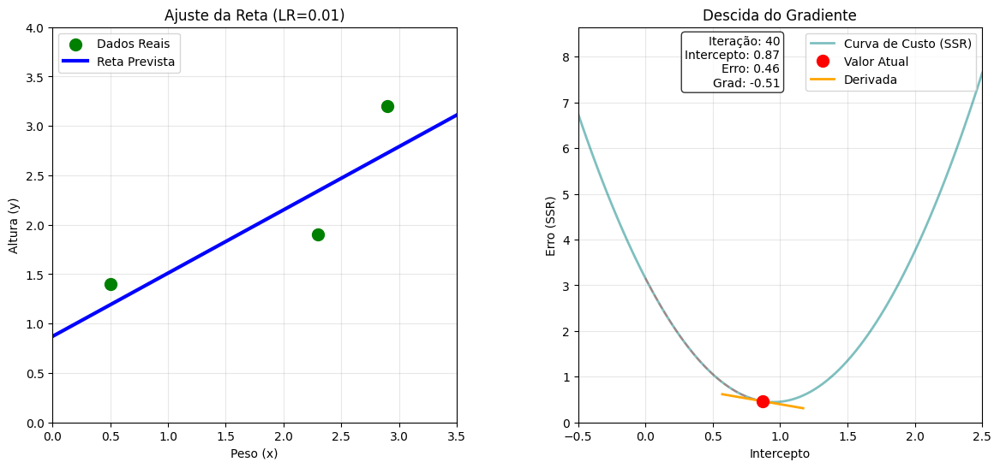

In [ ]:
# Dados.
weights = np.array([0.5, 2.3, 2.9])
heights_real = np.array([1.4, 1.9, 3.2])
fixed_slope = 0.64

history_data = gradient_descent(0.01, 0, weights, heights_real, fixed_slope)
animacao = create_animation(history_data, weights, heights_real, fixed_slope, 0.01)

HTML(animacao.to_jshtml())

# Exemplo 2: Learning rate = 0.05

No exemplo a seguir foram mantidos os mesmos dados com a exceção do learning rate que inicialmente era *0.01* e agora será de *0.05*.

Assim, ao executar o mesmo algoritmo, mas agora em um cenário com um learning hate consideravelmente maior, temos que o gradiente converge a 0 muito mais rapidamente, pois com um learning rate maior o algoritmo consegue chegar em um valor melhor de intercept em menos interações.



 INICIANDO COM LEARNING RATE = 0.05
Iteração 1: Old=0.0000 | Grad=-5.7040 | Step=-0.2852 | New=0.2852
Iteração 2: Old=0.2852 | Grad=-3.9928 | Step=-0.1996 | New=0.4848
Iteração 3: Old=0.4848 | Grad=-2.7950 | Step=-0.1397 | New=0.6246
Iteração 4: Old=0.6246 | Grad=-1.9565 | Step=-0.0978 | New=0.7224
Iteração 5: Old=0.7224 | Grad=-1.3695 | Step=-0.0685 | New=0.7909
Iteração 6: Old=0.7909 | Grad=-0.9587 | Step=-0.0479 | New=0.8388
Iteração 7: Old=0.8388 | Grad=-0.6711 | Step=-0.0336 | New=0.8724
Iteração 8: Old=0.8724 | Grad=-0.4697 | Step=-0.0235 | New=0.8959
Iteração 9: Old=0.8959 | Grad=-0.3288 | Step=-0.0164 | New=0.9123
Iteração 10: Old=0.9123 | Grad=-0.2302 | Step=-0.0115 | New=0.9238
Iteração 11: Old=0.9238 | Grad=-0.1611 | Step=-0.0081 | New=0.9319
Iteração 12: Old=0.9319 | Grad=-0.1128 | Step=-0.0056 | New=0.9375
Iteração 13: Old=0.9375 | Grad=-0.0790 | Step=-0.0039 | New=0.9415
Iteração 14: Old=0.9415 | Grad=-0.0553 | Step=-0.0028 | New=0.9442
Iteração 15: Old=0.9442 | Grad=-0.

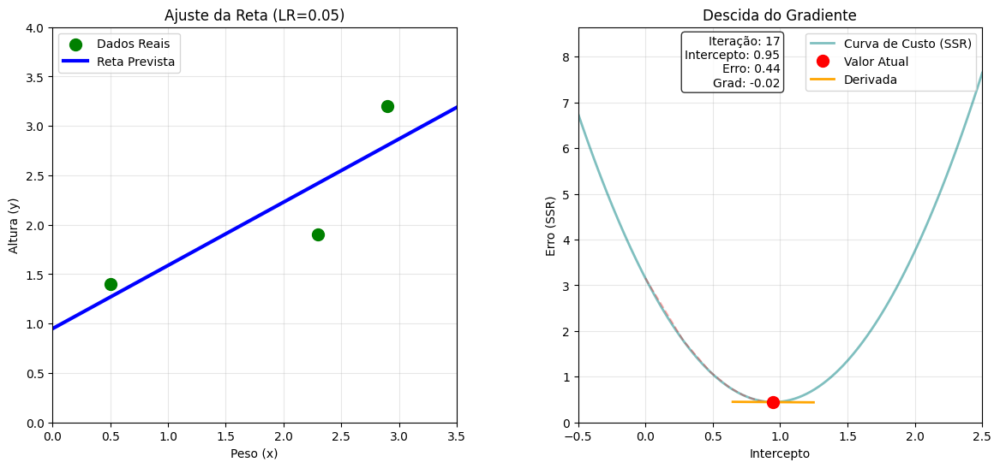

In [ ]:
history_data = gradient_descent(0.05, 0, weights, heights_real, fixed_slope)
animacao = create_animation(history_data, weights, heights_real, fixed_slope, 0.05)

HTML(animacao.to_jshtml())

# Questão B)
Adaptando a função usada anteriormente para executar o algoritmo com intercept e slope variando.

In [49]:
def gradient_descent_two_parameters(learning_rate, start_intercept, x, y, start_slope, max_iterations=40, tolerance=0.001):
    # Executa o algoritmo de Gradiente Descendente.

    current_intercept = start_intercept
    current_slope = start_slope
    history = []

    print(f"\n INICIANDO COM LEARNING RATE = {learning_rate}")

    # Adiciona o estado inicial.
    current_ssr = calculate_ssr(current_intercept, current_slope, x, y)

    # Calcula gradiente inicial.
    predictions = current_intercept + (current_slope * x)
    residuals = y - predictions
    d_intercept = -2 * np.sum(residuals)
    d_slope = -2 * np.sum(residuals * x)

    history.append((current_intercept, current_ssr, d_intercept, d_slope))

    for i in range(max_iterations):
        # Calcular Gradiente.
        predictions = current_intercept + (current_slope * x)
        residuals = y - predictions
        d_intercept = -2 * np.sum(residuals)
        d_slope = -2 * np.sum(residuals * x)

        # Calcular Passo.
        step_size_intercept = d_intercept * learning_rate
        step_size_slope = d_slope * learning_rate

        # Intercept.
        old_intercept = current_intercept
        new_intercept = old_intercept - step_size_intercept
        current_intercept = new_intercept

        # slope.
        old_slope = current_slope
        new_slope = old_slope - step_size_slope
        current_slope = new_slope

        # Novo Erro.
        current_ssr = calculate_ssr(current_intercept, current_slope, x, y)

        # Salvar Histórico.
        history.append((current_intercept, current_ssr, d_intercept, d_slope))

        print(f"Iteração {i+1}: Old i={old_intercept:.4f} | old s={old_slope:.4f} | d/di={d_intercept:.4f} |d/ds={d_slope:.4f} | Step i={step_size_intercept:.4f} |step s={step_size_slope:.4f} | New i={new_intercept:.4f} | New s={new_slope:.4f}")

        if abs(step_size_intercept) < tolerance and abs(step_size_slope) < tolerance:
            print(f"--> Convergiu na iteração {i+1}!")
            break

    return history

def create_line_animation_two_parameters(history, x_data, y_data, learning_rate):
    # 1. Criar Figura
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_xlim(0, 3.5)
    ax.set_ylim(0, 4)

    # Plotar os dados
    ax.scatter(x_data, y_data, color='green', s=100, label='Dados Reais', zorder=5)

    # Criar a linha da reta
    line_reg, = ax.plot([], [], 'b-', linewidth=3, label='Reta Prevista')

    # Caixa de texto para mostrar os valores
    info_text = ax.text(0.05, 0.8, '', transform=ax.transAxes, ha='left',
                        bbox=dict(boxstyle="round", facecolor='white', alpha=0.8))

    ax.set_title(f'Regressão com 2 Parâmetros (LR={learning_rate})')
    ax.set_xlabel('Peso (x)')
    ax.set_ylabel('Altura (y)')
    ax.legend(loc='lower right')
    ax.grid(True, alpha=0.3)

    # Função de Atualização
    def update(frame):
        b, m, gb, gm = history[frame]
        x_vals = np.array([0, 3.5])
        y_vals = b + (m * x_vals)

        # Atualizar o gráfico
        line_reg.set_data(x_vals, y_vals)

        # Atualizar o texto com os valores
        info_text.set_text(
            f'Iteração: {frame}\n'
            f'b (Intercept): {b:.2f}\n'
            f'm (Slope): {m:.2f}\n'
            f'gradient intercept : {gb:.2f}\n'
            f'gradient slope: {gm:.2f}'
        )

        return line_reg, info_text

    # Criar Animação
    ani = FuncAnimation(fig, update, frames=len(history), blit=True, interval=100)

    return ani

# Exemplo 1: Learning Rate = 0.01
Nesse exemplo iremos ultilizar os mesmos valores da questão anterior, com o diferencial de que o slope não será fixo.

Inicialmente escolheremos o $intercept$ como $b = 0$, e o $slope$ como $m = 1$.

A reta prevista é $$y = 1x + 0$$

E a Soma dos Erros ao Quadrado será $$f(b) = \sum_{i=1}^{n} \left( y_{\text{real}}^{(i)} - (1 \cdot x^{(i)} + 0) \right)^2 = 1.06$$
Concluindo que a reta passa distante dos pontos.

Nesse contexto, com 2 parâmetros, a principal mudança é que faremos uma derivada em relação ao $intercept$:
$$
\frac{\partial \text{SSR}}{\partial b}
=
-2 \sum_{i=1}^{n} \left( y_i - (b + m x_i) \right)
$$

E outra em relação ao $slope$:
$$
\frac{\partial \text{SSR}}{\partial m}
=
-2 \sum_{i=1}^{n} x_i \left( y_i - (b + m x_i) \right)
$$

Após essa etapa teremos o tamanho do passo para o novo $intercept$:
$$ step\ size\ intercept =\frac{\partial \text{SSR}}{\partial b} \ learning \ rate$$
Novo $intercept$:
$$ intercept \ novo = intercept - \ step \ size\ intercept$$

E teremos o tamanho do passo para o novo $intercept$:
$$ step\ size\ slope =\frac{\partial \text{SSR}}{\partial m} \ learning \ rate$$

Novo $slope$:
$$ slope \ novo = slope - \ step \ size\ slope$$

Dessa forma, a cada iteração do algoritmo os valores de $intercept$ e $slope$ vão sendo ajustados, e os gradientes de ambos os parâmetros devem se aproximar de 0, objetivando o menor valor possível de inclinação da reta tangente para ambos os parâmetros.

In [16]:
weights = np.array([0.5, 2.3, 2.9])
heights_real = np.array([1.4, 1.9, 3.2])


 INICIANDO COM LEARNING RATE = 0.01
Iteração 1: Old i=0.0000 | old s=1.0000 | d/di=-1.6000 |d/ds=-0.8000 | Step i=-0.0160 |step s=-0.0080 | New i=0.0160 | New s=1.0080
Iteração 2: Old i=0.0160 | old s=1.0080 | d/di=-1.4128 |d/ds=-0.3944 | Step i=-0.0141 |step s=-0.0039 | New i=0.0301 | New s=1.0119
Iteração 3: Old i=0.0301 | old s=1.0119 | d/di=-1.2831 |d/ds=-0.1233 | Step i=-0.0128 |step s=-0.0012 | New i=0.0430 | New s=1.0132
Iteração 4: Old i=0.0430 | old s=1.0132 | d/di=-1.1920 |d/ds=0.0574 | Step i=-0.0119 |step s=0.0006 | New i=0.0549 | New s=1.0126
Iteração 5: Old i=0.0549 | old s=1.0126 | d/di=-1.1270 |d/ds=0.1773 | Step i=-0.0113 |step s=0.0018 | New i=0.0661 | New s=1.0108
Iteração 6: Old i=0.0661 | old s=1.0108 | d/di=-1.0796 |d/ds=0.2563 | Step i=-0.0108 |step s=0.0026 | New i=0.0769 | New s=1.0083
Iteração 7: Old i=0.0769 | old s=1.0083 | d/di=-1.0441 |d/ds=0.3079 | Step i=-0.0104 |step s=0.0031 | New i=0.0874 | New s=1.0052
Iteração 8: Old i=0.0874 | old s=1.0052 | d/di=

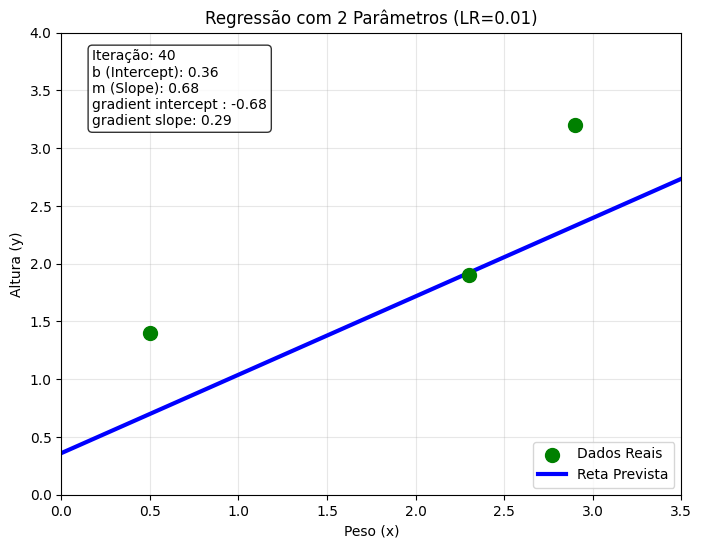

In [52]:
teste = gradient_descent_two_parameters(0.01, 0, weights, heights_real, 1, max_iterations=40, tolerance=0.001 )
animacao_b = create_line_animation_two_parameters(teste, weights, heights_real, 0.01)
HTML(animacao_b.to_jshtml())

# Exemplo: Learning rate = 0.05
Ademais, aplicando o mesmo algoritmo a uma taxa de aprendizado maior iremos obter o seguinte resultado:


 INICIANDO COM LEARNING RATE = 0.05
Iteração 1: Old i=0.0000 | old s=1.0000 | d/di=-1.6000 |d/ds=-0.8000 | Step i=-0.0800 |step s=-0.0400 | New i=0.0800 | New s=1.0400
Iteração 2: Old i=0.0800 | old s=1.0400 | d/di=-0.6640 |d/ds=1.2280 | Step i=-0.0332 |step s=0.0614 | New i=0.1132 | New s=0.9786
Iteração 3: Old i=0.1132 | old s=0.9786 | d/di=-1.1648 |d/ds=-0.1066 | Step i=-0.0582 |step s=-0.0053 | New i=0.1714 | New s=0.9839
Iteração 4: Old i=0.1714 | old s=0.9839 | d/di=-0.7546 |d/ds=0.7060 | Step i=-0.0377 |step s=0.0353 | New i=0.2092 | New s=0.9486
Iteração 5: Old i=0.2092 | old s=0.9486 | d/di=-0.9306 |d/ds=0.1512 | Step i=-0.0465 |step s=0.0076 | New i=0.2557 | New s=0.9411
Iteração 6: Old i=0.2557 | old s=0.9411 | d/di=-0.7376 |d/ds=0.4707 | Step i=-0.0369 |step s=0.0235 | New i=0.2926 | New s=0.9175
Iteração 7: Old i=0.2926 | old s=0.9175 | d/di=-0.7847 |d/ds=0.2345 | Step i=-0.0392 |step s=0.0117 | New i=0.3318 | New s=0.9058
Iteração 8: Old i=0.3318 | old s=0.9058 | d/di=-0

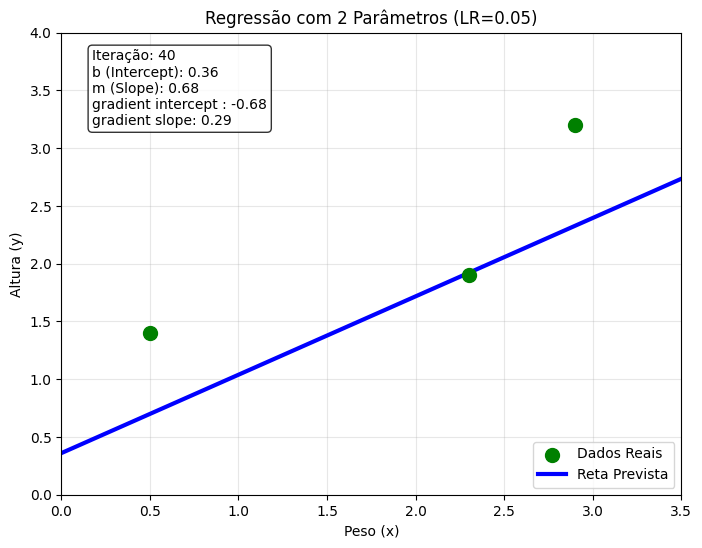

In [54]:
exemplo4 = gradient_descent_two_parameters(0.05, 0, weights, heights_real, 1, max_iterations=40, tolerance=0.001 )
animacao_exemplo4= create_line_animation_two_parameters(teste, weights, heights_real, 0.05)
HTML(animacao_exemplo4.to_jshtml())

No experimento, o gradiente descendente que ajusta apenas o intercepto 𝑏 convergiu mais rápido do que a versão que ajusta simultaneamente 𝑏 e o slope 𝑚, pois o valor inicial do slope já estava muito próximo do ótimo ($𝑚≈0,64$). Como a inclinação já estava ajustada no início, o algoritmo precisou apenas realizar pequenos deslocamentos verticais para reduzir o erro.

Nesse caso específico, o chute inicial ter sido distante do valor ótimo acabou aumentando o número de iterações, no entanto, em termos gerais, a otimização simultânea de todos os parâmetros nos daria um erro menor, visto que a reta poderia ser ajustada tanto em altura, quanto em inclinação em cenários desfavoráveis.

# Gradiente Descendente Estocástico